# Dictionary_creation_based on 
## Semantic Similarity(edge based) & Lexical Taxonomy(node based)

In [1]:
import pandas as pd
import pickle

import collections

from itertools import chain
from collections import Counter

In [2]:
import re

import re
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
import nltk

# 1.1 Text Pre-processing

In [43]:
#read data
df = pd.read_csv (r'C:\Users\siddhartha\Desktop\w2v text mapping\V1 - Work\dinein+Langid+i13set2.csv')

In [44]:
#filter only english data
is_df_en = df['review_langid']== 'en'
df = df[is_df_en]
df = df.head(50)
#review text_en as DF
df = df[['review_text']]
df

,review_text
1,Vacationing from America. Great Steaks! Excel...
3,We came into Olive Garden for a late dinner af...
4,I was part of a group when we went to Aya this...
7,Be prepare for a long wait. Basement can house...
8,The crepes here are the best we had for our st...
9,Excellent choice of Lebanese food to eat and t...
10,From all the fantastic reviews I had viewed be...
11,I used to go to this pub years ago and it was ...
12,My friend &amp; I decided to come for a cockta...
13,Two friends and I visited for the Tale as old ...


In [45]:
import numpy as np
import spacy
sp = spacy.load("en_core_web_sm")

In [46]:
def process_text(text):
    my_doc = sp(text)
    return [w.lemma_.lower() for w in my_doc if not w.is_stop and not w.is_punct and not w.is_digit and w.is_alpha]

# 1.2 N-Gram

In [47]:
from gensim.models import Phrases
#unigram
df['ntext'] = df['review_text'].apply(process_text)
#bigram
bigram = Phrases(df['ntext'], min_count=1, threshold=2)
df['twograms'] = df['ntext'].apply(lambda x : bigram[x])
#trigram
trigram = Phrases(bigram[df['ntext']], min_count=1, threshold=2)
df['threegrams'] = df['twograms'].apply(lambda x : trigram[x])

df.head(10)

,review_text,ntext,twograms,threegrams
1,Vacationing from America. Great Steaks! Excel...,"[vacation, america, great, steaks, excellent, ...","[vacation, america, great, steaks, excellent, ...","[vacation, america, great, steaks, excellent, ..."
3,We came into Olive Garden for a late dinner af...,"[come, olive, garden, late, dinner, day, unive...","[come, olive, garden, late, dinner, day, unive...","[come, olive, garden, late, dinner, day, unive..."
4,I was part of a group when we went to Aya this...,"[group, go, aya, month, birthday, party, famil...","[group, go, aya, month, birthday, party, famil...","[group, go, aya, month, birthday, party, famil..."
7,Be prepare for a long wait. Basement can house...,"[prepare, long, wait, basement, house, person,...","[prepare, long, wait, basement, house, person,...","[prepare, long, wait, basement, house, person,..."
8,The crepes here are the best we had for our st...,"[crepe, good, stay, paris, generous, serving, ...","[crepe, good, stay, paris, generous, serving, ...","[crepe, good, stay, paris, generous, serving, ..."
9,Excellent choice of Lebanese food to eat and t...,"[excellent, choice, lebanese, food, eat, away,...","[excellent, choice, lebanese_food, eat, away, ...","[excellent, choice, lebanese_food, eat, away, ..."
10,From all the fantastic reviews I had viewed be...,"[fantastic, review, view, take, look, expectat...","[fantastic, review, view, take, look, expectat...","[fantastic, review, view, take, look, expectat..."
11,I used to go to this pub years ago and it was ...,"[pub, year, ago, need, tlc, pleasure, handsome...","[pub, year, ago, need, tlc, pleasure, handsome...","[pub, year, ago, need, tlc, pleasure, handsome..."
12,My friend &amp; I decided to come for a cockta...,"[friend, amp, decide, come, cocktail, hour, la...","[friend, amp, decide, come, cocktail, hour, la...","[friend, amp, decide, come, cocktail, hour, la..."
13,Two friends and I visited for the Tale as old ...,"[friend, visit, tale, old, time, afternoon, te...","[friend, visit, tale, old, time, afternoon_tea...","[friend, visit, tale, old, time, afternoon_tea..."


## 2. Semantic Similarity(edge based), W2V

In [48]:
df['threegrams'].head()

1    [vacation, america, great, steaks, excellent, ...
3    [come, olive, garden, late, dinner, day, unive...
4    [group, go, aya, month, birthday, party, famil...
7    [prepare, long, wait, basement, house, person,...
8    [crepe, good, stay, paris, generous, serving, ...
Name: threegrams, dtype: object

#### 2.1 Word2Vec Model with Gensim

In [49]:
import nltk
import gensim
from gensim.models import word2vec
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\siddhartha\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [50]:
# tokenized_corpus = [nltk.word_tokenize(doc) for doc in corpus]
tokenized_corpus = df['threegrams'].tolist()
# Set values for various parameters
feature_size = 15    # Word vector dimensionality  
window_context = 20  # Context window size                                                                                    
min_word_count = 1   # Minimum word count                        
sample = 1e-3        # Downsample setting for frequent words
sg = 0               # skip-gram model = 1, CBOW = 0

w2v_model = word2vec.Word2Vec(tokenized_corpus, size=feature_size, 
                              window=window_context, min_count = min_word_count,
                              sg=sg, sample=sample, iter=5000)
w2v_model

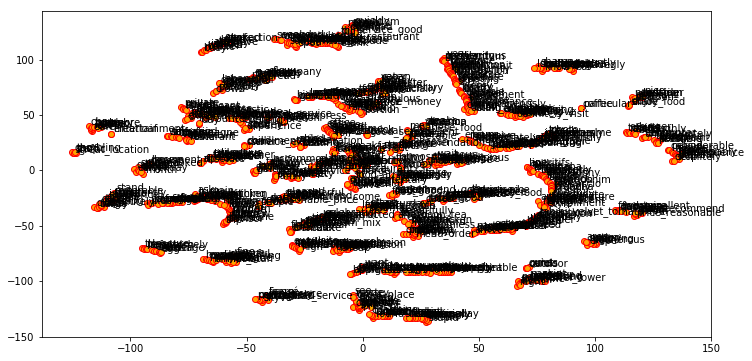

In [51]:
import matplotlib.pyplot as plt

%matplotlib inline

# visualize embeddings
from sklearn.manifold import TSNE

words = w2v_model.wv.index2word
wvs = w2v_model.wv[words]

tsne = TSNE(n_components=2, random_state=42, n_iter=5000, perplexity=5)
np.set_printoptions(suppress=True)
T = tsne.fit_transform(wvs)
labels = words

plt.figure(figsize=(12, 6))
plt.scatter(T[:, 0], T[:, 1], c='orange', edgecolors='r')
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label, xy=(x+1, y+1), xytext=(0, 0), textcoords='offset points')

In [52]:
w2v_model.most_similar('great')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('come', 0.6561635732650757),
 ('pollen', 0.5811405777931213),
 ('perfectly', 0.5679317116737366),
 ('street', 0.5628024339675903),
 ('social', 0.5605489015579224),
 ('tourist', 0.5448489189147949),
 ('reasonable_price', 0.538642168045044),
 ('hot', 0.538022518157959),
 ('private', 0.5350611805915833),
 ('perfection', 0.5350589752197266)]

In [53]:
# w2v_model.wv['wine'], w2v_model.wv['wine'].shape

In [54]:
vec_df = pd.DataFrame(wvs, index=words)
vec_df.shape

(1016, 15)

#### 2.2 Semantic Similarity = Link Strength

In [55]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

similarity_matrix = cosine_similarity(vec_df.values)
similarity_df = pd.DataFrame(similarity_matrix, index=words, columns=words)
similarity_df

,food,great,good,restaurant,time,come,dinner,friend,staff,order,...,deal,breaker,presumably,consequence,popular,stop,awesome,dubai,fountain,japanese
food,1.000000,0.151226,-0.061912,-0.288765,-0.244321,-0.122760,0.441960,0.145047,0.220344,0.022382,...,-0.313823,-0.293406,-0.262432,-0.247891,-0.139706,0.129798,0.005946,0.044244,0.059714,0.115659
great,0.151226,1.000000,0.270026,-0.013046,-0.310492,0.656164,-0.280413,-0.112466,-0.344907,0.057012,...,-0.336317,-0.333899,-0.341420,-0.360355,-0.364486,-0.324150,0.082709,0.060557,0.036267,0.007792
good,-0.061912,0.270026,1.000000,-0.063800,0.325010,0.560208,0.016505,0.331593,-0.365239,0.420381,...,-0.058111,-0.040805,-0.006954,0.013021,0.077694,0.052465,0.068589,0.106288,0.090896,0.067995
restaurant,-0.288765,-0.013046,-0.063800,1.000000,-0.080219,-0.213864,-0.367065,-0.259770,0.137271,-0.341675,...,0.471628,0.479748,0.495091,0.513947,0.544992,0.572568,-0.149931,-0.248735,-0.267480,-0.342322
time,-0.244321,-0.310492,0.325010,-0.080219,1.000000,0.067694,0.127336,0.361540,-0.485033,0.363057,...,0.371394,0.358325,0.374552,0.371839,0.354263,0.129612,0.081080,0.124488,0.122481,0.135243
come,-0.122760,0.656164,0.560208,-0.213864,0.067694,1.000000,-0.098744,-0.107338,-0.516511,0.475374,...,-0.234767,-0.222757,-0.218545,-0.213186,-0.234518,-0.358678,0.102652,0.135277,0.117869,0.097540
dinner,0.441960,-0.280413,0.016505,-0.367065,0.127336,-0.098744,1.000000,0.402350,-0.041289,0.417877,...,-0.258846,-0.257990,-0.246468,-0.211242,-0.158479,0.033423,-0.170369,-0.098019,-0.107719,-0.073547
friend,0.145047,-0.112466,0.331593,-0.259770,0.361540,-0.107338,0.402350,1.000000,-0.144634,0.177098,...,0.146431,0.123289,0.116171,0.117131,0.121194,0.143404,0.096080,0.103303,0.074615,0.050879
staff,0.220344,-0.344907,-0.365239,0.137271,-0.485033,-0.516511,-0.041289,-0.144634,1.000000,-0.071594,...,-0.038156,-0.028349,-0.023143,-0.000727,0.075876,0.259916,-0.450917,-0.481831,-0.445561,-0.434658
order,0.022382,0.057012,0.420381,-0.341675,0.363057,0.475374,0.417877,0.177098,-0.071594,1.000000,...,-0.169092,-0.165925,-0.152290,-0.144694,-0.134744,-0.310885,-0.279617,-0.199570,-0.214300,-0.205570


In [56]:
feature_names = np.array(words)
similarity_df.apply(lambda row: feature_names[np.argsort(-row.values)[1:5]], 
                    axis=1)

food                    [reputation, judging, advice, suffer]
great                       [come, pollen, perfectly, street]
good                          [confused, bad, help, parisian]
restaurant                      [price, corner, office, xmas]
time                     [advantage, vacation, dream, steaks]
come                  [dessert, finish_meal, coffee, crémaux]
dinner                [judge, appear, suffer, staff_friendly]
friend                      [joy, surely, linger, percussion]
staff                   [bread, value_money, accompany, keep]
order                      [amble, company, fetch, wednesday]
place                    [finally, opportunity, sunday, keen]
love                [accommodate, birthday, worth_wait, away]
visit                [bill_come, celebrate, effortless, anna]
table                        [dish_good, greek, prefer, meat]
wine                              [big, toe, advantage, roll]
price                 [restaurant, octopus, eulogise, tomato]
menu    

## 3. Graph theory on W2V

In [57]:
import networkx as nx

similarity_df_copy = similarity_df

df_graph = similarity_df_copy

In [58]:
df_graph.head()

,food,great,good,restaurant,time,come,dinner,friend,staff,order,...,deal,breaker,presumably,consequence,popular,stop,awesome,dubai,fountain,japanese
food,1.000000,0.151226,-0.061912,-0.288765,-0.244321,-0.122760,0.441960,0.145047,0.220344,0.022382,...,-0.313823,-0.293406,-0.262432,-0.247891,-0.139706,0.129798,0.005946,0.044244,0.059714,0.115659
great,0.151226,1.000000,0.270026,-0.013046,-0.310492,0.656164,-0.280413,-0.112466,-0.344907,0.057012,...,-0.336317,-0.333899,-0.341420,-0.360355,-0.364486,-0.324150,0.082709,0.060557,0.036267,0.007792
good,-0.061912,0.270026,1.000000,-0.063800,0.325010,0.560208,0.016505,0.331593,-0.365239,0.420381,...,-0.058111,-0.040805,-0.006954,0.013021,0.077694,0.052465,0.068589,0.106288,0.090896,0.067995
restaurant,-0.288765,-0.013046,-0.063800,1.000000,-0.080219,-0.213864,-0.367065,-0.259770,0.137271,-0.341675,...,0.471628,0.479748,0.495091,0.513947,0.544992,0.572568,-0.149931,-0.248735,-0.267480,-0.342322
time,-0.244321,-0.310492,0.325010,-0.080219,1.000000,0.067694,0.127336,0.361540,-0.485033,0.363057,...,0.371394,0.358325,0.374552,0.371839,0.354263,0.129612,0.081080,0.124488,0.122481,0.135243


In [59]:
node_list = list(df_graph.index)
node_list

['food',
 'great',
 'good',
 'restaurant',
 'time',
 'come',
 'dinner',
 'friend',
 'staff',
 'order',
 'place',
 'love',
 'visit',
 'table',
 'wine',
 'price',
 'menu',
 'friendly',
 'dish',
 'service',
 'meal',
 'eat',
 'get',
 'go',
 'bar',
 'ask',
 'offer',
 'bring',
 'sweet',
 'fresh',
 'wait',
 'look',
 'evening',
 'work',
 'drink',
 'atmosphere',
 'taste',
 'london',
 'expect',
 'little',
 'thing',
 'review',
 'think',
 'leave',
 'fantastic',
 'delicious',
 'return',
 'serve',
 'like',
 'burger',
 'seat',
 'group',
 'recommend',
 'plate',
 'main',
 'course',
 'different',
 'people',
 'beef',
 'bit',
 'helpful',
 'sit',
 'take',
 'cocktail',
 'kitchen',
 'outside',
 'want',
 'night',
 'second',
 'day',
 'glass',
 'birthday',
 'family',
 'crowd',
 'feel',
 'music',
 'starter',
 'waiter',
 'kind',
 'long',
 'reservation',
 'favourite',
 'enjoy',
 'warm',
 'choice',
 'service_excellent',
 'try',
 'thank',
 'amp',
 'amazing',
 'give',
 'etc',
 'wonderful',
 'chicken',
 'big',
 'happy

In [60]:
#creating a empty graph
G = nx.Graph()

In [61]:
#adding nodes
G.add_nodes_from(node_list)

In [62]:
G.nodes()

NodeView(('food', 'great', 'good', 'restaurant', 'time', 'come', 'dinner', 'friend', 'staff', 'order', 'place', 'love', 'visit', 'table', 'wine', 'price', 'menu', 'friendly', 'dish', 'service', 'meal', 'eat', 'get', 'go', 'bar', 'ask', 'offer', 'bring', 'sweet', 'fresh', 'wait', 'look', 'evening', 'work', 'drink', 'atmosphere', 'taste', 'london', 'expect', 'little', 'thing', 'review', 'think', 'leave', 'fantastic', 'delicious', 'return', 'serve', 'like', 'burger', 'seat', 'group', 'recommend', 'plate', 'main', 'course', 'different', 'people', 'beef', 'bit', 'helpful', 'sit', 'take', 'cocktail', 'kitchen', 'outside', 'want', 'night', 'second', 'day', 'glass', 'birthday', 'family', 'crowd', 'feel', 'music', 'starter', 'waiter', 'kind', 'long', 'reservation', 'favourite', 'enjoy', 'warm', 'choice', 'service_excellent', 'try', 'thank', 'amp', 'amazing', 'give', 'etc', 'wonderful', 'chicken', 'big', 'happy', 'food_good', 'nice', 'busy', 'saturday', 'small', 'indian', 'open', 'set', 'know', 

In [63]:
#adding edges
# for idx in df_graph.index:
#     for node in G.nodes():
#         G.add_edge(idx, node)

In [64]:
#adding edges
for node1 in df_graph.index:
    for node2 in G.nodes():
        weight = df_graph.loc[node1, node2]
        G.add_weighted_edges_from([(node1, node2, weight)])

In [65]:
G.edges()

EdgeView([('food', 'food'), ('food', 'great'), ('food', 'good'), ('food', 'restaurant'), ('food', 'time'), ('food', 'come'), ('food', 'dinner'), ('food', 'friend'), ('food', 'staff'), ('food', 'order'), ('food', 'place'), ('food', 'love'), ('food', 'visit'), ('food', 'table'), ('food', 'wine'), ('food', 'price'), ('food', 'menu'), ('food', 'friendly'), ('food', 'dish'), ('food', 'service'), ('food', 'meal'), ('food', 'eat'), ('food', 'get'), ('food', 'go'), ('food', 'bar'), ('food', 'ask'), ('food', 'offer'), ('food', 'bring'), ('food', 'sweet'), ('food', 'fresh'), ('food', 'wait'), ('food', 'look'), ('food', 'evening'), ('food', 'work'), ('food', 'drink'), ('food', 'atmosphere'), ('food', 'taste'), ('food', 'london'), ('food', 'expect'), ('food', 'little'), ('food', 'thing'), ('food', 'review'), ('food', 'think'), ('food', 'leave'), ('food', 'fantastic'), ('food', 'delicious'), ('food', 'return'), ('food', 'serve'), ('food', 'like'), ('food', 'burger'), ('food', 'seat'), ('food', 'gro

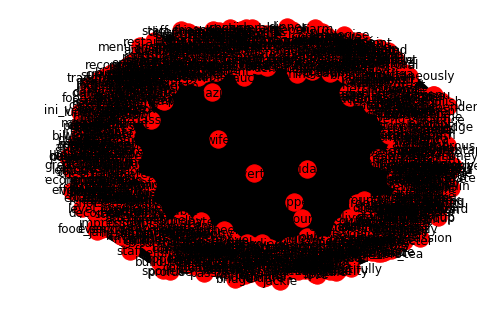

In [66]:
%matplotlib inline
import matplotlib.pyplot as plt
nx.draw(G, with_labels=True)

In [67]:
elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.75 and d['weight']<0.99999]
# esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.95]

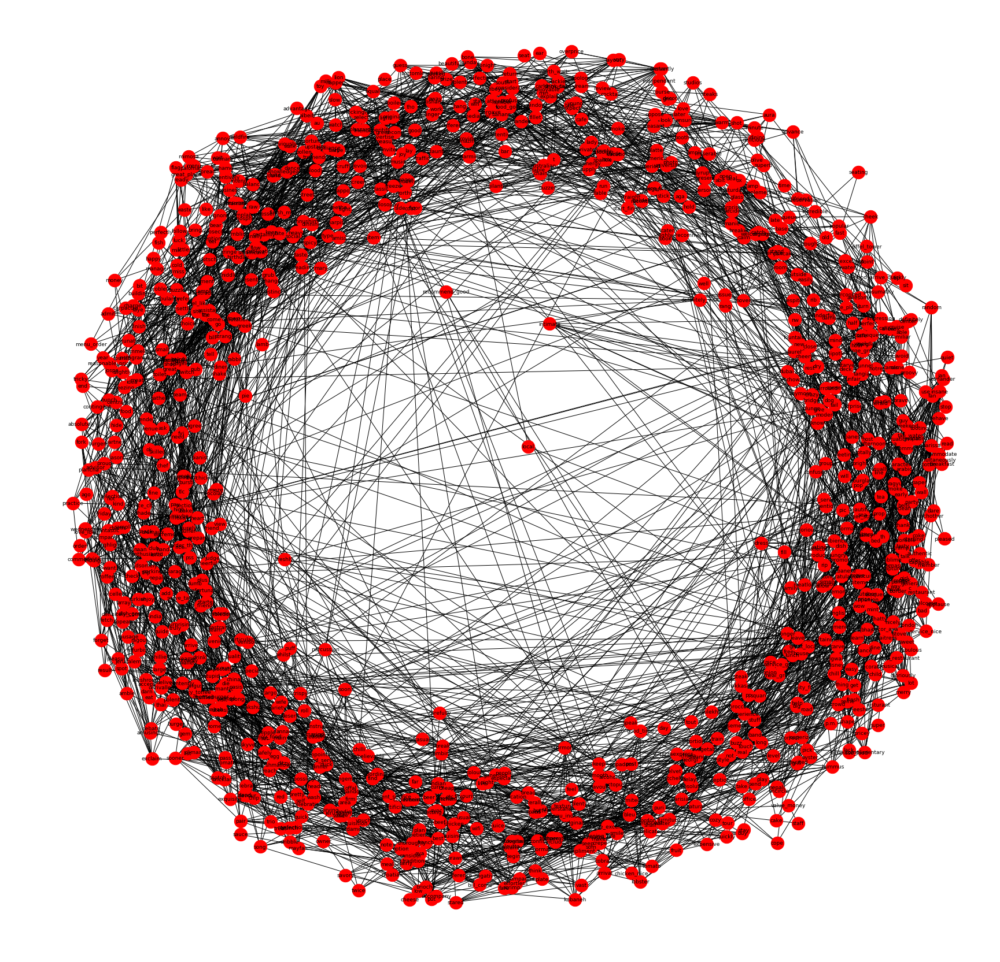

In [68]:
## %matplotlib inline
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(30,30))
plt.subplot(111)

pos=nx.spring_layout(G)

# nodes
nx.draw_networkx_nodes(G, pos, node_size=500)

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=1)
# nx.draw_networkx_edges(G, pos, edgelist=esmall,
#                        width=1, alpha=0.5, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=9, font_family='sans-serif')
# plt.axis([100,800,100,600])
plt.axis('off')
plt.show()

In [69]:
elarge_df = pd.DataFrame({"w1":list(map(list, zip(*elarge)))[0], "w2":list(map(list, zip(*elarge)))[1]})

In [70]:
elarge_df[elarge_df['w2']=="fight"]

,w1,w2
345,strange,fight
2302,walk,fight
2307,luck,fight
2313,flag,fight
2319,restroom,fight
2324,miss,fight
2328,dramatic,fight


In [71]:
elarge_df.w1.value_counts()

jerusalem_mix           17
octopus                 14
polenta                 13
obviously               12
stove                   12
dessert                 12
som                     11
situation               11
sticky_toffee           11
arrive                  11
staff_attentive         10
skyve                   10
shame                   10
dinner_staff            10
warm                    10
jackie                  10
window                  10
pack                     9
wander                   9
exceptional              9
feel_like                9
intimate                 9
smoked                   9
tell                     9
tahini_velvet_tomato     9
quality_food             9
fry_chicken              9
oil                      9
small                    9
coffee                   9
                        ..
dare                     1
favorite                 1
consequence              1
chilli                   1
exlecte                  1
applause                 1
p

In [72]:
elarge_df.w2.value_counts()

welcoming          12
brioche            11
building           11
limited            11
item               10
reminiscent        10
perfection         10
nw                 10
ready              10
booth              10
pancake            10
compliment         10
carly              10
catch              10
toilet             10
lady               10
charming            9
popular             9
post                9
seep                9
scrimp              9
pp                  9
skilled             9
surely              9
cooked              9
negative            9
spicy               9
instagramme         9
eager               9
assistant           9
                   ..
fable               1
knowledge           1
moroccan            1
lobster             1
staff_attentive     1
style               1
dry                 1
lebanese_food       1
beautiful           1
feel_like           1
garden              1
literally           1
later               1
arrive              1
love_place

In [73]:
w1_list = elarge_df['w1'].tolist()
w2_list = elarge_df['w2'].tolist()

In [74]:
G2 = nx.Graph()

In [75]:
for w1,w2 in elarge:
    G2.add_edge(w1,w2)

In [76]:
G2.degree('bravo')

8

In [114]:
G2.edges()

EdgeView([('good', 'confused'), ('confused', 'real'), ('confused', 'situation'), ('confused', 'waitress'), ('confused', 'girl'), ('confused', 'behave'), ('confused', 'totally'), ('confused', 'bad'), ('confused', 'help'), ('confused', 'parisian'), ('restaurant', 'price'), ('dinner', 'judge'), ('dinner', 'appear'), ('dinner', 'suffer'), ('dinner', 'staff_friendly'), ('judge', 'small'), ('judge', 'serve_table'), ('judge', 'pastrami'), ('judge', 'disappointing'), ('judge', 'cheeseburger'), ('judge', 'surprisingly'), ('judge', 'large'), ('judge', 'appear'), ('judge', 'suffer'), ('judge', 'staff_friendly'), ('judge', 'advice'), ('judge', 'reputation'), ('judge', 'judging'), ('appear', 'serve_table'), ('appear', 'obviously'), ('appear', 'cheeseburger'), ('appear', 'surprisingly'), ('appear', 'large'), ('appear', 'suffer'), ('appear', 'staff_friendly'), ('appear', 'advice'), ('appear', 'reputation'), ('appear', 'judging'), ('appear', 'diner'), ('appear', 'instagramme'), ('suffer', 'serve_table

In [83]:
G2.nodes()

NodeView(('good', 'confused', 'restaurant', 'price', 'dinner', 'judge', 'appear', 'suffer', 'staff_friendly', 'staff', 'bread', 'value_money', 'visit', 'bill_come', 'wine', 'big', 'eat', 'accept', 'get', 'night', 'bar', 'forgave', 'shockingly', 'slow', 'ask', 'tricky', 'walk', 'bring', 'scrimp', 'sweet', 'english', 'capable', 'mint', 'sheesha', 'fresh', 'tea', 'afternoon_tea', 'fill', 'complimentary', 'look', 'carly', 'provide', 'drink', 'charm', 'company', 'wednesday', 'amusingly', 'ditzy', 'exclaim', 'taste', 'different', 'london', 'cope', 'correct', 'delay', 'little', 'shame', 'thing', 'service_good', 'think', 'oil', 'fantastic', 'hand', 'delicious', 'despite', 'return', 'annoy', 'spicy', 'item', 'burger', 'thoroughly', 'fairly', 'safely', 'best', 'seat', 'eachother', 'random', 'group', 'tap_water', 'c', 'totally', 'bad', 'recommend', 'smoke', 'read', 'promote', 'bit', 'chicken', 'lentil', 'cocktail', 'shot', 'stick', 'pudding', 'abit', 'aura', 'hold', 'kitchen', 'knowledge', 'cheap

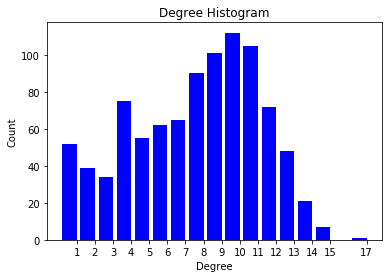

In [77]:
degree_sequence = sorted([d for n, d in G2.degree()], reverse=True)  # degree sequence
# print "Degree sequence", degree_sequence
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.80, color='b')

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
ax.set_xticks([d + 0.4 for d in deg])
ax.set_xticklabels(deg)

# draw graph in inset
# plt.axes([0.4, 0.4, 0.5, 0.5])
# Gcc = sorted(nx.connected_component_subgraphs(G), key=len, reverse=True)[0]
# pos = nx.spring_layout(G2)
# plt.axis('off')
# nx.draw_networkx_nodes(G2, pos, node_size=20)
# nx.draw_networkx_edges(G2, pos, alpha=0.4)

plt.show()

In [81]:
#extract high degree nodes
# h_nodes = 
deg, cnt

((17, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1),
 (1, 7, 21, 48, 72, 105, 112, 101, 90, 65, 62, 55, 75, 34, 39, 52))

In [102]:
G2.degree('parmesan')

11

In [113]:
#create a sub graph which has degree>=12
for node in G2.nodes:
    if G2.degree(node) > 11:
        print(node, G2.degree(node))

judge 14
appear 14
suffer 14
staff_friendly 13
charm 12
company 12
annoy 14
spicy 15
item 15
put 14
border 13
seine 12
finally 12
opportunity 13
sunday 12
surprisingly 12
large 13
unbelievable 13
prawn 15
curry 15
vouch 14
artificial 12
colour 12
stove 13
assistant 13
sommelier 13
agree 13
skilled 13
tough 12
knowledgeable 12
attentively 13
grub 15
exceptionally 13
dress 12
adorable 13
puzzle 12
undaunted 12
tonight 13
charming 14
coffee 12
pop 12
dessert 13
highlight 12
turkish 12
exquisite 12
note 12
performance 12
simultaneously 13
show 13
booth 14
supply 13
win 14
prize 12
guess 12
finish 12
toilet 13
building 14
fare 12
seep 12
plancha 12
carefully 14
coordinate 14
harmony 13
texture 13
certainly 13
amiss 12
maybe 12
advice 14
catch 13
welcoming 15
lady 12
impression 14
herald 13
pss 12
celebrate 13
arrangement 13
touch 12
character 13
disney 12
liberal 12
lemon 12
vigilantly 12
aperitifs 12
lion 13
obviously 12
reputation 12
diner 12
instagramme 12
punch 13
josperized 13
grill 14

In [100]:
P_graph.nodes()

NodeView(('period',))

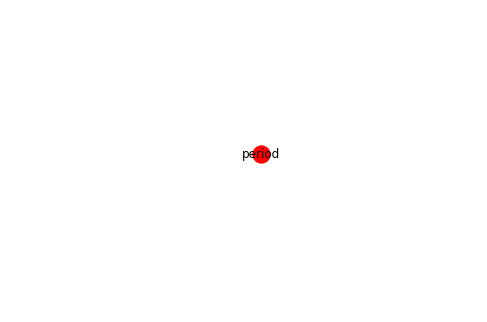

In [94]:
%matplotlib inline
import matplotlib.pyplot as plt
nx.draw(P_graph, with_labels=True)

In [41]:
G.number_of_edges()

15753

In [42]:
from networkx.classes.function import density
density(G)

1.0113636363636365

## 4. Lexical Taxonomy (Node Based), PMI

In [79]:
# n(x) - frequency of 'X' occuring in the corpus
# n(y) - frequency of 'Y' occuring in the corpus
# n(x,y) - frequency of 'X followed by Y' in the corpus

# N - Super set 'Corpus'

# p(x) - probability of 'X' --> n(x)/N
# p(y) - probability of 'X' --> n(y)/N
# p(x,y) - join probability '(x,y)' --> conditional probability/chance of x,y --> p(x|y)/P(x)P(y)

In [80]:
# Load Corpus
df_node= df['threegrams']
df_node.head()

1    [vacation, america, great, steaks, excellent, ...
3    [come, olive, garden, late, dinner, day, unive...
4    [group, go, aya, month, birthday, party, famil...
7    [prepare, long, wait, basement, house, person,...
8    [crepe, good, stay, paris, generous, serving, ...
Name: threegrams, dtype: object

In [81]:
df_node = df_node.tolist()
df_node

[['vacation',
  'america',
  'great',
  'steaks',
  'excellent',
  'atmosphere',
  'aga',
  'dream',
  'staff',
  'superb',
  'eat'],
 ['come',
  'olive',
  'garden',
  'late',
  'dinner',
  'day',
  'universial',
  'studios',
  'staff',
  'get',
  'seat',
  'straight',
  'away',
  'pleasant',
  'surprise',
  'offer',
  'complementary',
  'glass',
  'wine',
  'food_arrive_quickly',
  'taste',
  'great'],
 ['group',
  'go',
  'aya',
  'month',
  'birthday',
  'party',
  'family',
  'member',
  'recommend',
  'eat',
  'usually',
  'lebanese',
  'restaurant_london',
  'crowd',
  'price',
  'lack',
  'decor_aya',
  'mind',
  'capture',
  'hand',
  'carve',
  'furniture',
  'eloquent',
  'decor_aya',
  'beautiful',
  'arabic',
  'feel',
  'music',
  'accompany',
  'food',
  'new',
  'expect',
  'eat',
  'lebanese',
  'familiar',
  'menu',
  'sure',
  'fail',
  'order_lot',
  'little',
  'starter',
  'plate',
  'keep',
  'flow',
  'freshly',
  'bake',
  'bread',
  'hard',
  'meze',
  'main_c

In [82]:
df_node_corpus = [w for row in df_node for w in row]
df_node_corpus

['vacation',
 'america',
 'great',
 'steaks',
 'excellent',
 'atmosphere',
 'aga',
 'dream',
 'staff',
 'superb',
 'eat',
 'come',
 'olive',
 'garden',
 'late',
 'dinner',
 'day',
 'universial',
 'studios',
 'staff',
 'get',
 'seat',
 'straight',
 'away',
 'pleasant',
 'surprise',
 'offer',
 'complementary',
 'glass',
 'wine',
 'food_arrive_quickly',
 'taste',
 'great',
 'group',
 'go',
 'aya',
 'month',
 'birthday',
 'party',
 'family',
 'member',
 'recommend',
 'eat',
 'usually',
 'lebanese',
 'restaurant_london',
 'crowd',
 'price',
 'lack',
 'decor_aya',
 'mind',
 'capture',
 'hand',
 'carve',
 'furniture',
 'eloquent',
 'decor_aya',
 'beautiful',
 'arabic',
 'feel',
 'music',
 'accompany',
 'food',
 'new',
 'expect',
 'eat',
 'lebanese',
 'familiar',
 'menu',
 'sure',
 'fail',
 'order_lot',
 'little',
 'starter',
 'plate',
 'keep',
 'flow',
 'freshly',
 'bake',
 'bread',
 'hard',
 'meze',
 'main_course',
 'come',
 'time',
 'accompany',
 'different',
 'sauce',
 'side',
 'place',
 '

In [83]:
from collections import Counter
from math import log

In [84]:
def gen_bigrams(data, window_size=100):
    for idx in range(len(data)):
        window = data[idx: idx + window_size]
        
        if len(window) < 2:
            break
            
        w = window[0]
        for next_word in window[1:]:
            yield (w, next_word)

In [85]:
def construct_vocab(data):
    vocab = Counter()
    
    for (w1, w2) in gen_bigrams(data, window_size=5): # count 1gram & 2gram
        vocab.update([w1, w2, (w1, w2)])
    return vocab

In [86]:
def calc_pmi(vocab):
    det = sum(vocab.values())
    
    for (w1, w2) in filter(lambda el: isinstance(el, tuple), vocab):
        p_a, p_b = float(vocab[w1]), float(vocab[w2])
        p_ab = float(vocab[(w1, w2)])
        
        yield (w1, w2, log((det * p_ab) / (p_a * p_b), 2))

In [87]:
vocab = construct_vocab(df_node_corpus)
pmilist = []
for (w1, w2, pmi) in calc_pmi(vocab):
    pmilist.append({"pmi":pmi, "w1":w1, "w2":w2})
    print("{}_{}: {:.3f}".format(w1, w2, pmi))

vacation_america: 9.732
vacation_great: 5.194
vacation_steaks: 10.625
vacation_excellent: 6.732
america_great: 3.494
america_steaks: 8.925
america_excellent: 5.032
america_atmosphere: 5.410
great_steaks: 4.387
great_excellent: 1.494
great_atmosphere: 1.872
great_aga: 4.194
steaks_excellent: 5.925
steaks_atmosphere: 6.303
steaks_aga: 9.625
steaks_dream: 9.625
excellent_atmosphere: 2.410
excellent_aga: 5.732
excellent_dream: 5.732
excellent_staff: 1.645
atmosphere_aga: 6.111
atmosphere_dream: 6.111
atmosphere_staff: 2.023
atmosphere_superb: 4.526
aga_dream: 9.433
aga_staff: 5.345
aga_superb: 7.848
aga_eat: 6.111
dream_staff: 5.345
dream_superb: 7.848
dream_eat: 6.111
dream_come: 4.973
staff_superb: 3.760
staff_eat: 2.023
staff_come: 1.886
staff_olive: 4.345
superb_eat: 4.526
superb_come: 3.388
superb_olive: 6.848
superb_garden: 6.263
eat_come: 1.651
eat_olive: 5.111
eat_garden: 4.526
eat_late: 3.789
come_olive: 3.973
come_garden: 3.388
come_late: 3.651
come_dinner: 1.803
olive_garden: 6.

wifi_sit: 7.111
wifi_plan: 8.433
wifi_day: 6.433
wifi_enjoy: 7.433
sit_plan: 6.111
sit_day: 4.111
sit_enjoy: 5.111
sit_warm: 5.111
plan_day: 5.433
plan_enjoy: 6.433
plan_warm: 6.433
plan_crepe: 6.848
day_enjoy: 4.433
day_warm: 4.433
day_crepe: 4.848
day_plenty: 4.433
enjoy_warm: 5.433
enjoy_crepe: 5.848
enjoy_plenty: 5.433
enjoy_option: 6.433
warm_crepe: 5.848
warm_plenty: 5.433
warm_option: 6.433
warm_sweet: 4.625
crepe_plenty: 5.848
crepe_option: 6.848
crepe_sweet: 5.040
crepe_savory: 7.848
plenty_option: 6.433
plenty_sweet: 4.625
plenty_savory: 7.433
plenty_area: 5.433
option_sweet: 5.625
option_savory: 8.433
option_area: 6.433
option_well: 5.625
sweet_savory: 6.625
sweet_area: 4.625
sweet_well: 3.818
sweet_place: 1.870
savory_area: 7.433
savory_well: 6.625
savory_place: 4.678
savory_crepe: 7.848
area_well: 4.625
area_place: 2.678
area_crepe: 5.848
area_excellent: 3.732
well_place: 1.870
well_crepe: 5.040
well_excellent: 2.925
well_choice: 3.818
place_crepe: 3.093
place_excellent: 0

time_incredible: 2.587
time_greet: 3.324
afternoon_tea_start_finish: 7.433
afternoon_tea_incredible: 6.111
afternoon_tea_greet: 6.848
afternoon_tea_friendly: 4.526
start_finish_incredible: 6.111
start_finish_greet: 6.848
start_finish_friendly: 4.526
start_finish_host: 6.848
incredible_greet: 5.526
incredible_friendly: 3.204
incredible_host: 5.526
incredible_explain: 5.526
greet_friendly: 3.941
greet_host: 6.263
greet_explain: 6.263
greet_seat_beautiful: 7.848
friendly_host: 3.941
friendly_explain: 3.941
friendly_seat_beautiful: 4.526
friendly_room: 3.526
host_explain: 6.263
host_seat_beautiful: 6.848
host_room: 5.848
host_calm: 7.848
explain_seat_beautiful: 6.848
explain_room: 5.848
explain_calm: 7.848
explain_atmosphere: 4.526
seat_beautiful_room: 6.433
seat_beautiful_calm: 8.433
seat_beautiful_atmosphere: 5.111
seat_beautiful_fresh: 5.111
room_calm: 7.433
room_atmosphere: 4.111
room_fresh: 4.111
room_decor: 5.433
calm_atmosphere: 6.111
calm_fresh: 6.111
calm_decor: 7.433
calm_food_ar

great_line: 2.609
expensive_wait: 3.166
expensive_long: 4.303
expensive_line: 5.040
expensive_love: 2.538
wait_long: 3.651
wait_line: 4.388
wait_love: 1.886
wait_team: 4.388
long_line: 5.526
long_love: 3.023
long_team: 5.526
long_happy: 4.303
line_love: 3.760
line_team: 6.263
line_happy: 5.040
line_cheerful: 6.848
love_team: 3.760
love_happy: 2.538
love_cheerful: 4.345
love_burgers: 5.345
team_happy: 5.040
team_cheerful: 6.848
team_burgers: 7.848
team_fantastic: 4.040
happy_cheerful: 5.625
happy_burgers: 6.625
happy_fantastic: 2.818
happy_big: 3.818
cheerful_burgers: 8.433
cheerful_fantastic: 4.625
cheerful_big: 5.625
cheerful_good: 3.006
burgers_fantastic: 5.625
burgers_big: 6.625
burgers_good: 4.006
burgers_shake: 9.433
fantastic_big: 2.818
fantastic_good: 0.199
fantastic_shake: 5.625
fantastic_town: 5.625
big_shake: 6.625
big_town: 6.625
big_manager: 4.040
good_shake: 4.006
good_town: 4.006
good_manager: 1.421
good_faye: 3.006
shake_town: 9.433
shake_manager: 6.848
shake_faye: 8.433

dining_excellent_service: 9.433
dining_unrivalled: 9.433
expetience_know: 7.111
expetience_excellent_service: 9.433
expetience_unrivalled: 9.433
expetience_beef: 6.848
know_excellent_service: 7.111
know_unrivalled: 7.111
know_beef: 4.526
know_burger: 3.941
excellent_service_unrivalled: 9.433
excellent_service_beef: 6.848
excellent_service_burger: 6.263
excellent_service_extremely: 9.433
unrivalled_beef: 6.848
unrivalled_burger: 6.263
unrivalled_extremely: 9.433
unrivalled_cozy: 8.433
beef_extremely: 6.848
beef_cozy: 5.848
beef_romantic: 6.848
burger_extremely: 6.263
burger_cozy: 5.263
burger_romantic: 6.263
burger_atmosphere: 2.941
extremely_cozy: 8.433
extremely_romantic: 9.433
extremely_atmosphere: 6.111
extremely_convenient: 9.433
cozy_romantic: 8.433
cozy_atmosphere: 5.111
cozy_convenient: 8.433
cozy_parking: 8.433
romantic_atmosphere: 6.111
romantic_convenient: 9.433
romantic_parking: 9.433
romantic_love: 5.345
atmosphere_convenient: 6.111
atmosphere_parking: 6.111
atmosphere_love

lovely_chain: 4.848
lovely_feel_like: 4.433
lovely_independent: 6.433
breakfast_chain: 6.263
breakfast_feel_like: 5.848
breakfast_independent: 7.848
breakfast_cafe: 6.848
chain_feel_like: 5.848
chain_independent: 7.848
chain_cafe: 6.848
chain_great: 2.609
feel_like_independent: 7.433
feel_like_cafe: 6.433
feel_like_great: 2.194
feel_like_choice_food: 6.433
independent_cafe: 8.433
independent_great: 4.194
independent_choice_food: 8.433
independent_drink: 5.848
cafe_great: 3.194
cafe_choice_food: 7.433
cafe_drink: 4.848
cafe_food: 3.075
great_choice_food: 3.194
great_drink: 0.609
great_food: 1.159
great_ok: 3.609
choice_food_drink: 4.848
choice_food_food: 3.075
choice_food_ok: 6.848
choice_food_condiment: 8.433
drink_food: 1.490
drink_condiment: 5.848
drink_include: 3.526
food_ok: 2.490
food_condiment: 4.075
food_include: 1.753
ok_condiment: 7.848
ok_include: 5.526
ok_good: 3.421
ok_chilli: 7.848
condiment_include: 7.111
condiment_good: 4.006
condiment_chilli: 9.433
condiment_sauce: 7.84

bunch_evening: 5.111
chef_pss: 7.111
chef_proud: 7.111
chef_evening: 4.789
chef_warm: 5.111
pss_proud: 9.433
pss_evening: 6.111
pss_warm: 7.433
pss_service: 5.526
proud_evening: 6.111
proud_warm: 7.433
proud_service: 5.526
proud_deliver: 9.433
evening_warm: 4.111
evening_service: 2.204
evening_deliver: 6.111
evening_anna: 6.111
warm_service: 3.526
warm_deliver: 7.433
warm_anna: 7.433
warm_celebrate: 5.848
service_deliver: 5.526
service_anna: 5.526
service_celebrate: 3.941
service_birthday: 2.066
deliver_anna: 9.433
deliver_celebrate: 7.848
deliver_birthday: 5.973
deliver_evening_pre: 8.433
anna_celebrate: 7.848
anna_birthday: 5.973
anna_evening_pre: 8.433
anna_dinner: 5.263
celebrate_birthday: 5.388
celebrate_evening_pre: 6.848
celebrate_dinner: 3.678
celebrate_arrangement: 7.848
birthday_evening_pre: 4.973
birthday_dinner: 1.803
birthday_arrangement: 5.973
birthday_smooth: 5.973
evening_pre_dinner: 4.263
evening_pre_arrangement: 8.433
evening_pre_smooth: 8.433
evening_pre_effortless: 

absolutely_pink: 7.433
flavour_southern_fry: 6.433
flavour_chicken: 4.263
flavour_pink: 7.433
flavour_supposedly: 7.433
southern_fry_chicken: 5.263
southern_fry_pink: 8.433
southern_fry_supposedly: 8.433
southern_fry_restaurant: 3.526
chicken_pink: 6.263
chicken_supposedly: 6.263
chicken_restaurant: 1.356
chicken_mean: 5.263
pink_supposedly: 9.433
pink_restaurant: 4.526
pink_mean: 8.433
pink_uncooke: 8.433
supposedly_restaurant: 4.526
supposedly_mean: 8.433
supposedly_uncooke: 8.433
supposedly_southern_fry: 8.433
restaurant_mean: 3.526
restaurant_uncooke: 3.526
restaurant_southern_fry: 3.526
mean_uncooke: 7.433
mean_southern_fry: 7.433
mean_place: 3.678
mean_expect: 5.526
uncooke_southern_fry: 7.433
uncooke_place: 3.678
uncooke_expect: 4.526
uncooke_taste: 5.111
southern_fry_place: 3.678
southern_fry_expect: 4.526
southern_fry_taste: 5.111
southern_fry_right: 6.433
place_expect: 0.771
place_right: 2.678
place_boil: 4.678
expect_taste: 2.204
expect_right: 3.526
expect_boil: 5.526
expect

ask_finally: 4.848
waitress_water: 5.040
waitress_time: 2.102
waitress_finally: 5.625
waitress_bring: 2.625
water_time: 3.324
water_finally: 6.848
water_bring: 3.848
water_charge: 6.263
time_finally: 3.909
time_bring: 0.909
time_charge: 3.324
finally_bring: 4.433
finally_charge: 6.848
finally_time: 3.909
finally_manager: 5.848
bring_charge: 3.848
bring_time: 0.909
bring_manager: 2.848
bring_right_away: 4.433
charge_time: 3.324
charge_manager: 5.263
charge_right_away: 6.848
charge_shame: 6.263
time_manager: 2.324
time_right_away: 3.909
time_shame: 3.324
manager_right_away: 5.848
manager_shame: 5.263
manager_good: 1.421
manager_food_great: 5.263
right_away_shame: 6.848
right_away_good: 3.006
right_away_food_great: 6.848
right_away_room: 6.433
shame_good: 2.421
shame_food_great: 6.263
shame_room: 5.848
shame_let: 5.848
good_food_great: 2.421
good_room: 2.006
good_let: 2.006
good_indifferent: 4.006
food_great_room: 5.848
food_great_let: 5.848
food_great_indifferent: 7.848
food_great_servic

tuna_africa: 7.848
tuna_lobster: 6.263
tuna_kid: 7.848
south_africa: 8.433
south_lobster: 6.848
south_kid: 8.433
south_meal: 4.185
africa_lobster: 7.848
africa_kid: 9.433
africa_meal: 5.185
africa_macaroni: 9.433
lobster_kid: 7.848
lobster_meal: 3.600
lobster_macaroni: 7.848
lobster_amp: 4.526
kid_meal: 5.185
kid_macaroni: 9.433
kid_amp: 6.111
kid_cheese: 7.848
meal_macaroni: 5.185
meal_amp: 1.863
meal_cheese: 3.600
meal_great: -0.054
macaroni_amp: 6.111
macaroni_cheese: 7.848
macaroni_great: 4.194
macaroni_order_lot: 7.848
amp_cheese: 4.526
amp_great: 0.872
amp_order_lot: 4.526
amp_food: 0.753
cheese_great: 2.609
cheese_order_lot: 6.263
cheese_food: 2.490
cheese_end: 6.263
great_order_lot: 2.609
great_end: 2.609
order_lot_food: 2.490
order_lot_end: 6.263
order_lot_space: 6.848
food_end: 2.490
food_little: 1.268
food_space: 3.075
end_little: 5.040
end_space: 6.848
end_dessert: 5.040
end_waitress: 5.040
little_space: 5.625
little_dessert: 3.818
little_waitress: 3.818
little_recommendati

note_worth: 6.263
note_look: 4.388
pocket_brocken: 9.433
pocket_worth: 7.848
pocket_look: 5.973
pocket_world: 8.433
brocken_worth: 7.848
brocken_look: 5.973
brocken_world: 8.433
brocken_private_room: 8.433
worth_look: 4.388
worth_world: 6.848
worth_private_room: 6.848
worth_pre: 6.263
look_world: 4.973
look_private_room: 4.973
look_pre: 4.388
look_arranged: 5.973
world_private_room: 7.433
world_pre: 6.848
world_arranged: 8.433
world_dinner_menu: 8.433
private_room_pre: 6.848
private_room_arranged: 8.433
private_room_dinner_menu: 8.433
private_room_glamour: 8.433
pre_arranged: 7.848
pre_dinner_menu: 7.848
pre_glamour: 7.848
pre_place: 3.093
arranged_dinner_menu: 9.433
arranged_glamour: 9.433
arranged_place: 4.678
arranged_earth: 9.433
dinner_menu_glamour: 9.433
dinner_menu_place: 4.678
dinner_menu_earth: 9.433
dinner_menu_wrong: 8.433
glamour_place: 4.678
glamour_earth: 9.433
glamour_wrong: 8.433
glamour_let: 7.433
place_earth: 4.678
place_wrong: 3.678
place_let: 2.678
place_enjoyment: 

decor_work: 4.263
decor_bare: 7.433
decor_concrete: 7.433
decor_inside: 6.433
work_bare: 6.263
work_concrete: 6.263
work_inside: 5.263
work_make: 4.678
bare_concrete: 9.433
bare_inside: 8.433
bare_make: 7.848
bare_feel: 6.433
concrete_inside: 8.433
concrete_make: 7.848
concrete_feel: 6.433
concrete_ambience: 7.848
inside_make: 6.848
inside_feel: 5.433
inside_ambience: 6.848
inside_food: 3.075
make_feel: 4.848
make_ambience: 6.263
make_food: 2.490
make_average: 6.848
feel_ambience: 4.848
feel_average: 5.433
feel_twice: 5.433
ambience_food: 2.490
ambience_average: 6.848
ambience_twice: 6.848
ambience_evening: 4.526
food_average: 3.075
food_twice: 3.075
average_twice: 7.433
average_evening: 5.111
average_meal: 4.185
average_wife: 6.848
twice_evening: 5.111
twice_meal: 4.185
twice_wife: 6.848
twice_time: 3.909
evening_meal: 1.863
evening_time: 1.587
evening_disappoint: 4.526
meal_wife: 3.600
meal_time: 0.661
meal_disappoint: 3.600
meal_sunday: 5.185
wife_time: 3.324
wife_disappoint: 6.263


In [90]:
df_pmi = pd.DataFrame(pmilist)

In [91]:
df_pmi.head()

,pmi,w1,w2
0,9.732167,vacation,america
1,5.194202,vacation,great
2,10.625252,vacation,steaks
3,6.732167,vacation,excellent
4,3.493763,america,great


# Existing Dictionary for Evaluation

In [5]:
dictionary_hotel = pd.read_csv(r'C:\Users\siddhartha\Desktop\w2v text mapping\V1 - Work\dict_final.csv',index_col = 0)
dictionary_hotel['Keys'] = dictionary_hotel['Keys'].str.lower()
dictionary_hotel.head(5)

,Keys,Tag,Attribute
0,staff_super,friendly-staff,service
1,kitchen_equip,kitchenette,room_amenities
2,solo_traveller,backpacker,suitable_for
3,italian_chinese,restaurant,hotel_amenities
4,river_cruise,cruise,hotel_type
